In [28]:
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objs as go
import plotly.express as px
import numpy as np
import os
import sys
import pickle
import seaborn as sns
sns.set_theme(style="whitegrid")
import warnings
warnings.filterwarnings("ignore")

**The divergence of the results from reality is due to an overuse of nuclear power (either because EDF has done load following which is not modelled by the programme because nuclear power is too cheap, or because the ENTSOE data gives too much availability) as well as to the non-modelling of the Netherlands and Austria**

# 1. Simulation running or results extraction

In [2]:
#Run this for simulation
year=2017 #must be between 2017 and 2019
number_of_sub_techs=5
consumption=pd.read_csv('Input data/'+str(year)+'/'+str(year)+'_MultiNodeAreaConsumption.csv')

if os.path.basename(os.getcwd()) == "Seven_node_Europe":
    os.chdir('../..')
from Main_historical import *

Variables=main_historical(year,number_of_sub_techs)

	 Model creation at 0:00:00.885140
	 Start solving at 0:05:21.604903
	 Solved at 0:14:35.719583
	 Total duration: 0:14:40.034712


In [29]:
#Run this to load a result file
year=2018 #must be between 2017 and 2019
consumption=pd.read_csv('Input data/'+str(year)+'/'+str(year)+'_MultiNodeAreaConsumption.csv')
with open("Result files/Result_"+str(year)+".pickle", 'rb') as f:
    Variables=pickle.load(f)

In [35]:
Variables

{'energy':        AREAS                Date    TECHNOLOGIES    energy
 0         IT 2018-10-17 05:00:00  HydroReservoir      0.00
 1         IT 2018-10-17 05:00:00            Coal   6030.00
 2         IT 2018-10-17 05:00:00         Lignite      0.00
 3         IT 2018-10-17 05:00:00           Solar    102.00
 4         IT 2018-10-17 05:00:00     curtailment      0.00
 ...      ...                 ...             ...       ...
 797155    GB 2018-08-31 15:00:00             CCG  12135.13
 797156    GB 2018-08-31 15:00:00         NewNuke      0.00
 797157    GB 2018-08-31 15:00:00     WindOnShore   3672.28
 797158    GB 2018-08-31 15:00:00             TAC      0.00
 797159    GB 2018-08-31 15:00:00         OldNuke   7678.00
 
 [797160 rows x 4 columns],
 'energyCosts':    AREAS    TECHNOLOGIES   energyCosts
 0     IT  HydroReservoir  0.000000e+00
 1     IT            Coal  1.890746e+09
 2     IT         Lignite -0.000000e+00
 3     IT           Solar  0.000000e+00
 4     IT     curtailment

# 2. Preliminary calculations

In [30]:
states=["Historical"]
exch_list=[Variables["exchange"]]
data=[Variables["energy"]]
data_stor=[Variables["storageOut"]]
data_capa=[Variables["capacity"]]
data_stor_capa=[Variables["Pmax"]]
colors=["black"]

In [31]:
#subtechs list
l=data_capa[0]
l=l.TECHNOLOGIES.unique()
u=[]
n_list=[]
for tech_name in l:
    if tech_name[:4]=="Coal" and tech_name!="Coal":
        n_list.append(tech_name[4:])

# 3. Results plot

## a. Capacity

In [32]:
# total_consum=round(consum.areaConsumption.sum()/10**6,2)
tech_list=["OldNuke","NewNuke","Coal","Lignite","CCG","TAC","HydroRiver","HydroReservoir",'HydroStorage',"Biomass",
           "WindOnShore","WindOffShore","Solar","Battery"]



df_capa=pd.DataFrame(columns=["TECHNOLOGIES"]+states)
df_capa["TECHNOLOGIES"]=np.array(tech_list)
# print(len(data))
for i in range(len(data)):
    capa=data_capa[i]
    for t in tech_list:
        t_list=[t]
        if len(n_list)>0:
            for j in range(len(n_list)):
                t_list.append(t+n_list[j])

        if t not in ["HydroStorage","Battery"] :
            val=round(capa[capa.TECHNOLOGIES.isin(t_list)].capacity.to_numpy().sum()/10**3,2)
    #         print(val)
            df_capa.loc[df_capa.TECHNOLOGIES==t,states[i]]=val
        else:
            u=data_stor_capa[i]
            val=round(u[u.STOCK_TECHNO==t].Pmax.to_numpy().sum()/10**3,2)
#             print(val)
            df_capa.loc[df_capa.TECHNOLOGIES==t,states[i]]=val
total_capa=df_capa[states[0]].sum()

In [33]:
df_capa

,TECHNOLOGIES,Historical
0,OldNuke,98.05
1,NewNuke,0.0
2,Coal,55.02
3,Lignite,21.28
4,CCG,132.37
5,TAC,15.15
6,HydroRiver,29.52
7,HydroReservoir,39.28
8,HydroStorage,36.68
9,Biomass,14.11


In [34]:
tech_list=["OldNuke","NewNuke","Coal","Lignite","CCG","TAC","HydroRiver","HydroReservoir",'HydroStorage',"Biomass",
           "WindOnShore","WindOffShore","Solar","Battery"]

for area in ["FR","DE","GB","BE","IT","ES","CH"]:
    print("\nCapacities installed for "+area)
    df_capa=pd.DataFrame(columns=["TECHNOLOGIES"]+states)
    df_capa["TECHNOLOGIES"]=np.array(tech_list)
    # print(len(data))
    for i in range(len(data)):
        capa=data_capa[i]
        capa=capa[capa.AREAS==area]
        for t in tech_list:
            t_list=[t]
            if len(n_list)>0:
                for j in range(len(n_list)):
                    t_list.append(t+n_list[j])

            if t not in ["HydroStorage","Battery"] :
                val=round(capa[capa.TECHNOLOGIES.isin(t_list)].capacity.to_numpy().sum()/10**3,2)
        #         print(val)
                df_capa.loc[df_capa.TECHNOLOGIES==t,states[i]]=val
            else:
                u=data_stor_capa[i]
                u=u[u.AREAS==area]
                val=round(u[u.STOCK_TECHNO==t].Pmax.to_numpy().sum()/10**3,2)
    #             print(val)
                df_capa.loc[df_capa.TECHNOLOGIES==t,states[i]]=val
    print(df_capa)


Capacities installed for FR
      TECHNOLOGIES Historical
0          OldNuke        NaN
1          NewNuke        NaN
2             Coal        NaN
3          Lignite        NaN
4              CCG        NaN
5              TAC        NaN
6       HydroRiver        NaN
7   HydroReservoir        NaN
8     HydroStorage        NaN
9          Biomass        NaN
10     WindOnShore        NaN
11    WindOffShore        NaN
12           Solar        NaN
13         Battery        NaN
      TECHNOLOGIES Historical
0          OldNuke      63.13
1          NewNuke        0.0
2             Coal        3.0
3          Lignite        0.0
4              CCG       6.56
5              TAC        0.7
6       HydroRiver      11.22
7   HydroReservoir       8.58
8     HydroStorage       5.02
9          Biomass       1.84
10     WindOnShore      12.52
11    WindOffShore        0.0
12           Solar       7.17
13         Battery        0.0

Capacities installed for DE
      TECHNOLOGIES Historical
0          O

## b. Production

In [8]:
country="FR"
p=Variables["capacity"]
p=p[p.AREAS==country]
p

,AREAS,TECHNOLOGIES,capacity
65,FR,HydroReservoir,8578.0
66,FR,Coal,2997.0
67,FR,Lignite,0.0
68,FR,Solar,7170.0
69,FR,curtailment,20000.0
70,FR,WindOffShore,0.0
71,FR,Biomass,1840.0
72,FR,HydroRiver,11222.0
73,FR,CCG,6564.0
74,FR,NewNuke,0.0


### i. Production at the 7 nodes scale 

In [9]:
# total_consum=round(consum.areaConsumption.sum()/10**6,2)
tech_list=["OldNuke","NewNuke","Coal","Lignite","CCG","TAC","HydroRiver","HydroReservoir",'HydroStorage',"Biomass",
           "WindOnShore","WindOffShore","Solar","Battery","curtailment"]



df_prod=pd.DataFrame(columns=["TECHNOLOGIES"]+states)
df_prod["TECHNOLOGIES"]=np.array(tech_list)

for i in range(len(data)):
    prod=data[i]
    for t in tech_list:
        t_list=[t]
        if len(n_list)>0:
            for j in range(len(n_list)):
                t_list.append(t+n_list[j])

        if t!="HydroStorage":
            val=round(prod[prod.TECHNOLOGIES.isin(t_list)].energy.to_numpy().sum()/10**6,2)
    #         print(val)
            df_prod.loc[df_prod.TECHNOLOGIES==t,states[i]]=val
        else:
            u=data_stor[i]
            val=round(u[u.STOCK_TECHNO==t].storageOut.to_numpy().sum()/10**6,2)

            df_prod.loc[df_prod.TECHNOLOGIES==t,states[i]]=val
total_prod=df_prod[states[0]].sum()

In [10]:
df_prod_bar=pd.DataFrame(columns=["TECHNOLOGIES","Production (TWh)","Production (%)","Scenario"])
for c in df_prod.columns[1:]:
    u=df_prod[["TECHNOLOGIES",c]]
    u.rename(columns={c:"Production (TWh)"},inplace=True)
    u["Production (%)"]=u["Production (TWh)"]/u["Production (TWh)"].sum()*100
    u["Scenario"]=c
    df_prod_bar=pd.concat([df_prod_bar,u],ignore_index=True)

In [11]:
import plotly.express as px
fig = px.bar(df_prod_bar, x='Scenario', y='Production (%)', color="TECHNOLOGIES")
fig.show()

In [12]:
fig = px.pie(df_prod_bar, values='Production (TWh)', names='TECHNOLOGIES', title='Production per technology (in %)')
fig.show()

### ii. Production at country scale

In [13]:
# total_consum=round(consum.areaConsumption.sum()/10**6,2)
countries=["FR","DE","BE","GB","IT","CH","ES"]
tech_list=["OldNuke","NewNuke","Biomass","Coal","Lignite","CCG","TAC","HydroRiver","HydroReservoir",'HydroStorage','Battery',
            "WindOnShore","WindOffShore","Solar"]



df_prod_country=pd.DataFrame(columns=["AREAS","TECHNOLOGIES","State","Production (TWh)"])


for i in range(len(states)):
    prod=data[i]
    for c in countries:
        for t in tech_list:
            t_list=[t]
            if len(n_list)>0:
                for j in range(len(n_list)):
                    t_list.append(t+n_list[j])
            if t not in ["HydroStorage","Battery"]:
                val=round(prod[(prod.TECHNOLOGIES.isin(t_list)) & (prod.AREAS==c)].energy.to_numpy().sum()/10**6,2)
                array=np.array([[c,t,states[i],val]])
                df_prod_country=pd.concat([df_prod_country,
                                           pd.DataFrame(array,columns=["AREAS","TECHNOLOGIES","State","Production (TWh)"])])
            else:
                u=data_stor[i]
                val=round(u[(u.STOCK_TECHNO==t) & (u.AREAS==c)].storageOut.to_numpy().sum()/10**6,2)
                array=np.array([[c,t,states[i],val]])
                df_prod_country=pd.concat([df_prod_country,
                                           pd.DataFrame(array,columns=["AREAS","TECHNOLOGIES","State","Production (TWh)"])])

df_prod_country["Production (TWh)"]=df_prod_country["Production (TWh)"].astype('float')
                
# comparison_per_country=df_prod_country.copy()
# for country in countries:
#     total_prod=df_prod[states[0]].sum()
#     total_consum=round(consum[consum.AREAS==country].areaConsumption.sum()/10**6,2)
#     comparison_per_country.loc[comparison_per_country.AREAS==country,"Production (TWh)"]= comparison_per_country.loc[comparison_per_country.AREAS==country,"Production (TWh)"].astype(float)/total_consum
    
# comparison_per_country["Difference with historical"]=np.zeros(len(comparison_per_country))
# for state in states:
#     comparison_per_country.loc[comparison_per_country.State==state,"Difference with "+states[0]]=(comparison_per_country.loc[comparison_per_country.State==state,"Production (TWh)"]-comparison_per_country.loc[comparison_per_country.State=="Historical","Production (TWh)"])*100                

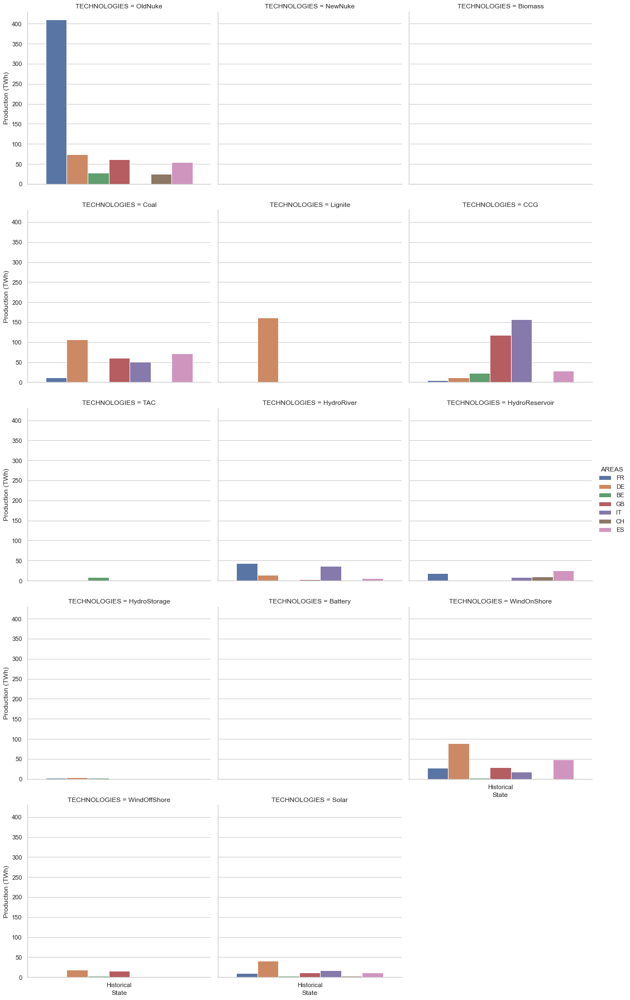

In [14]:
from  matplotlib.ticker import PercentFormatter
g = sns.catplot(x="State", y="Production (TWh)",hue="AREAS",col="TECHNOLOGIES",col_wrap=3,kind="bar",
                data=df_prod_country)
# for ax in g.axes.flat:
#     ax.yaxis.set_major_formatter(PercentFormatter())

plt.show()

In [15]:
country="GB"
p=Variables["energy"]
p=p[p.AREAS==country]
storout=Variables["storageOut"]
#print("HydroStorage",round(storout[storout.AREAS==country].storageOut.sum()/10**6,2),"TWh")
storout=storout[(storout.AREAS==country) & (storout.STOCK_TECHNO!="Battery")]
storout=storout.rename(columns={'STOCK_TECHNO':'TECHNOLOGIES',"storageOut":"energy"})
p=pd.concat([p,storout],ignore_index=True)
tot=0
for t in p.TECHNOLOGIES.unique():
    l=p[p.TECHNOLOGIES==t]
    print(t,round(l.energy.sum()/10**6,2),"TWh")
    tot+=l.energy.sum()
print("Total produced",round(tot/10**6,2),"TWh")

HydroReservoir 0.0 TWh
Coal 60.72 TWh
Lignite 0.0 TWh
Solar 11.15 TWh
curtailment 0.0 TWh
WindOffShore 15.51 TWh
Biomass 0.06 TWh
HydroRiver 3.24 TWh
CCG 117.77 TWh
NewNuke 0.0 TWh
WindOnShore 28.89 TWh
TAC 0.05 TWh
OldNuke 61.9 TWh
HydroStorage 0.26 TWh
Total produced 299.55 TWh


In [16]:
tech_list=["OldNuke","NewNuke","Biomass","Coal","CCG","HydroRiver","HydroReservoir",'HydroStorage',
           "WindOnShore","WindOffShore","Solar","curtailment"]
sorted_df=pd.DataFrame(columns=["Date","TECHNOLOGIES","energy"])
for i in range(len(tech_list)):
    d=p[p.TECHNOLOGIES==tech_list[i]].sort_values(by="Date")
    sorted_df=pd.concat([sorted_df,d[["Date","TECHNOLOGIES","energy"]]],ignore_index=True)
fig = px.area(sorted_df, x="Date", y="energy", color="TECHNOLOGIES",line_group="TECHNOLOGIES",title=country+" simulations")
consum=consumption[consumption.AREAS==country]
fig.add_scatter(x=consum.Date, y=consum.areaConsumption, name="Consumption",mode="lines",line_color="black")
fig.show()

## c. HydroStorage operations

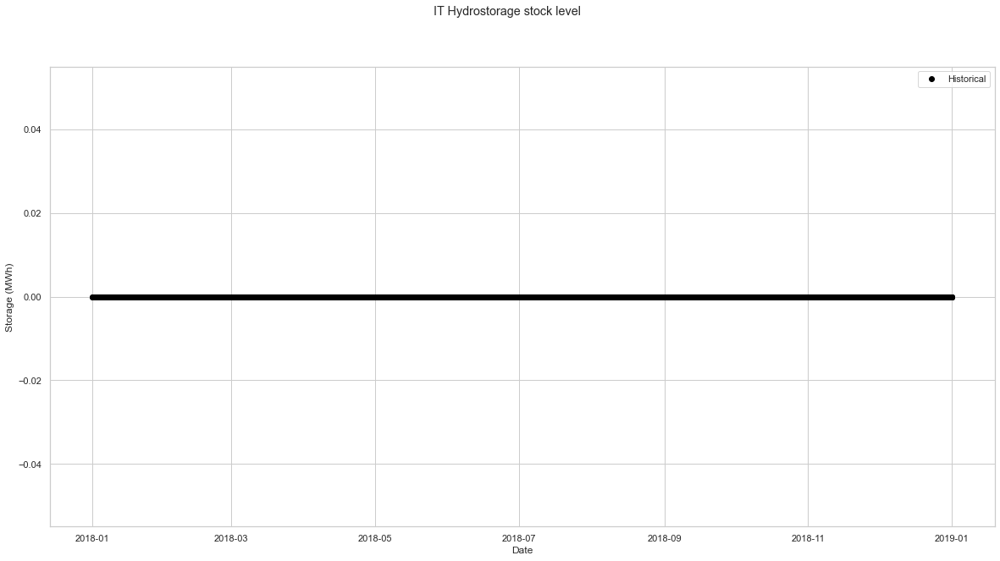

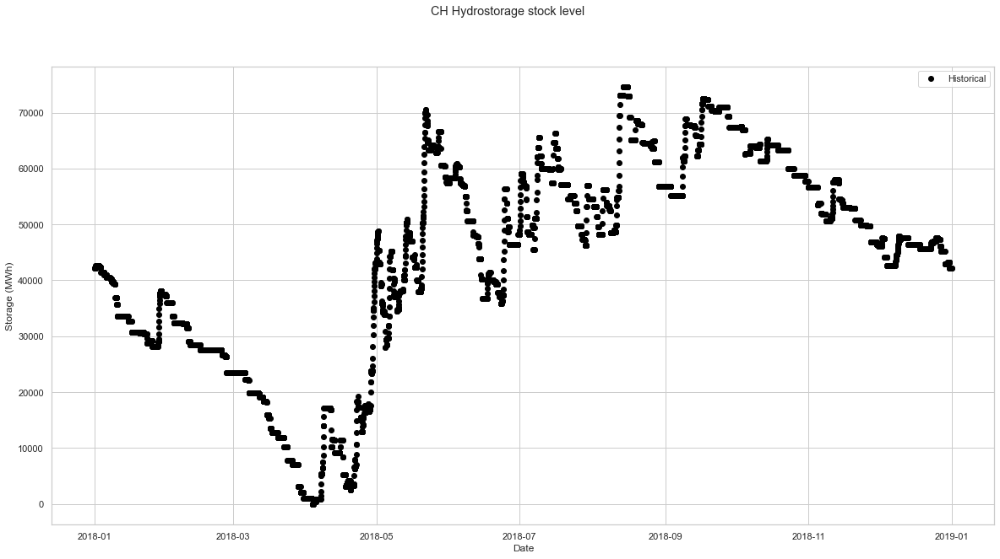

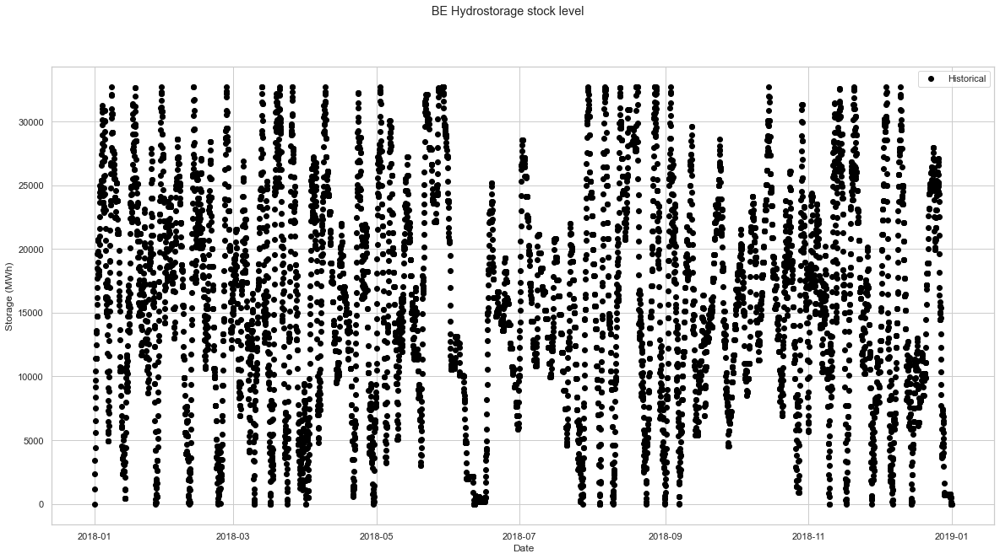

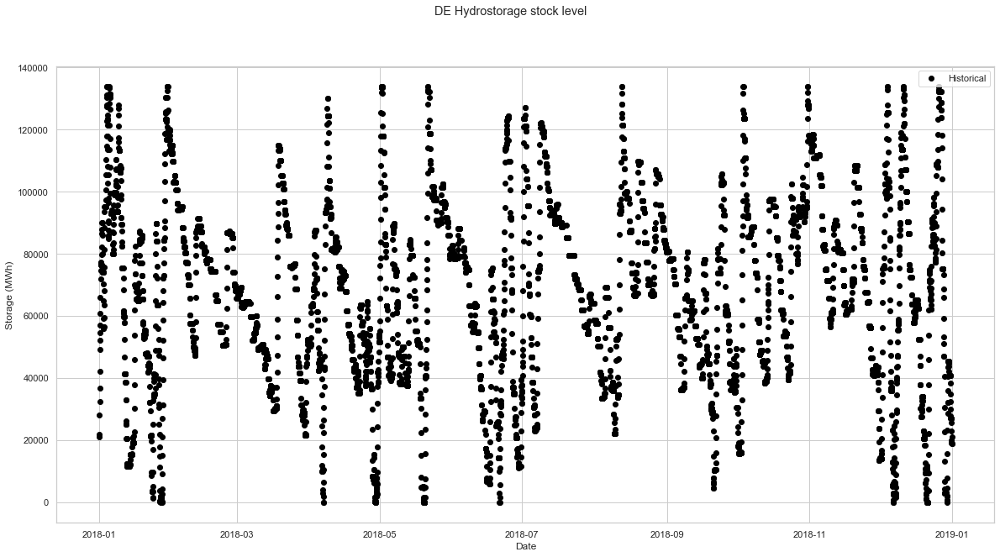

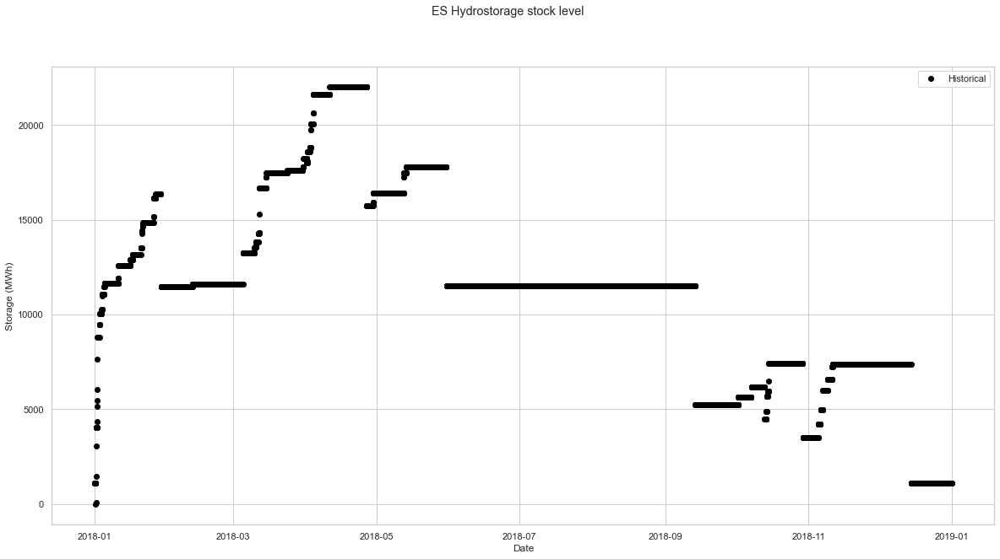

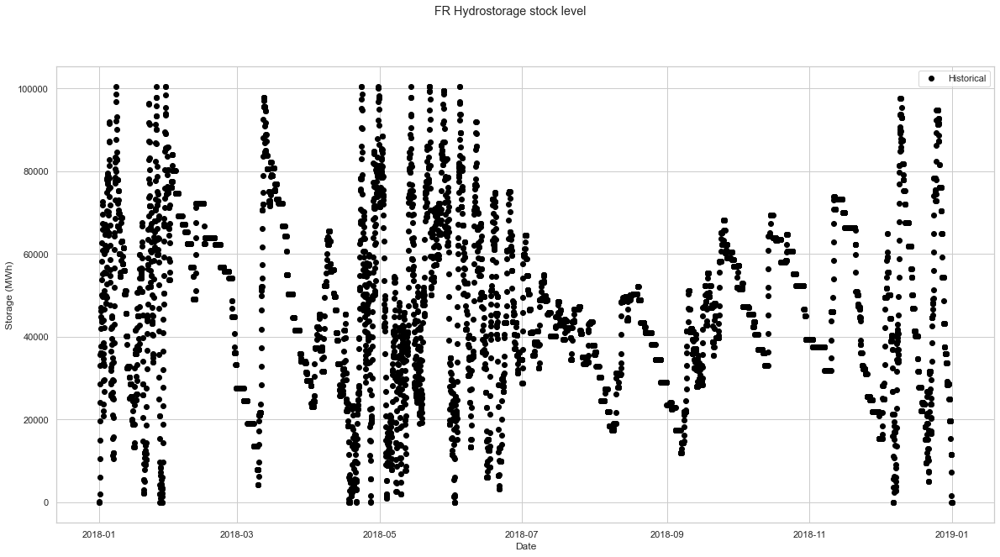

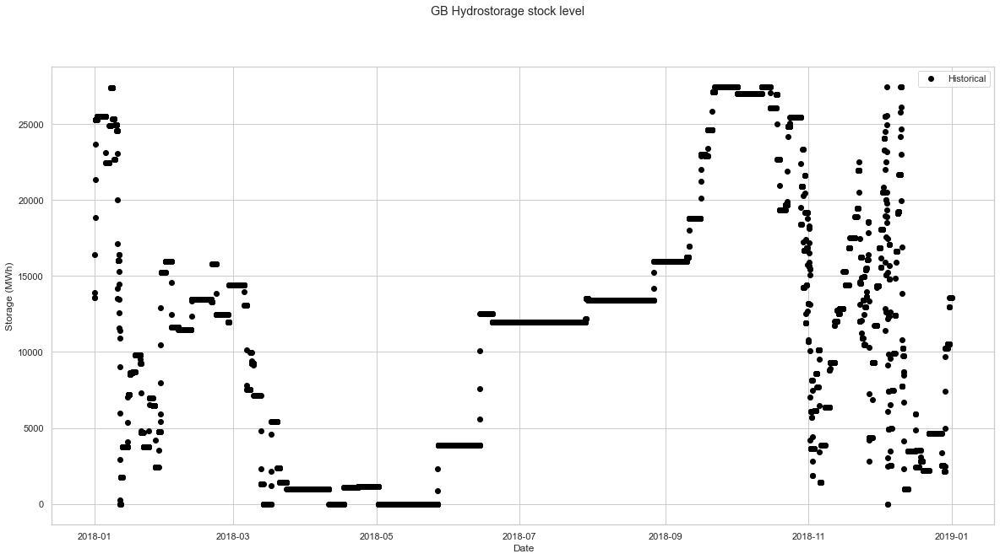

In [17]:
stocklevels=[Variables["stockLevel"]]
for area in stocklevels[0].AREAS.unique():
    fig, ax = plt.subplots(1,figsize=(20,10))
    fig.suptitle(area+" Hydrostorage stock level")
    v=stocklevels[0]
    u=v[v.AREAS==area]
    u=u[u.STOCK_TECHNO=="HydroStorage"]
    ax.plot(u.Date,u.stockLevel,"o",color=colors[0],label=states[0])
    ax.legend()
    ax.set_ylabel("Storage (MWh)")
    plt.xlabel("Date")

## d. Exchanges

Text(0.5, 0, 'Date')

<Figure size 720x360 with 0 Axes>

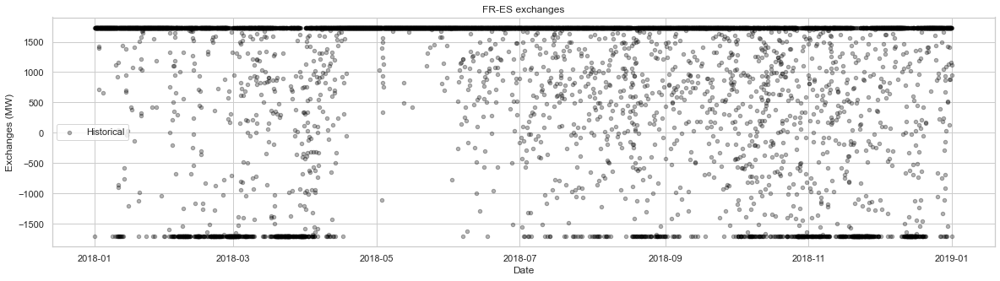

In [18]:

c1,c2="FR","ES"

plt.figure(figsize=(10,5))

fig=plt.figure(figsize=(20,5))
plt.title(c1+'-'+c2+" exchanges")
    
u=exch_list[0]
v=u[(u.AREAS==c1)&(u.AREAS1==c2)]
v.TIMESTAMP=pd.to_datetime(v.TIMESTAMP)
plt.scatter(v.TIMESTAMP,v.exchange,label=states[0],s=20,alpha=0.3,color=colors[0])
plt.legend()
plt.ylabel('Exchanges (MW)')
# plt.subplots_adjust(left=None, bottom=0, right=None, top=1, wspace=0.2, hspace=None)
plt.xlabel("Date")

In [19]:
ext_fr=["DE","BE","GB","IT","CH","ES"]
exchanges_fr=pd.DataFrame(columns=["state",'countries',"Exchanges (TWh)"])
other_exchanges=pd.DataFrame(columns=["state",'countries',"Exchanges (TWh)"])

for i in range(len(exch_list)):
    s=0
    exchange=exch_list[i]
    for c in ["DE","BE","GB","IT","CH","ES"]:
        value=round(exchange[(exchange.AREAS=="FR") & (exchange.AREAS1==c)].exchange.sum()/10**6,2)
        s+=value
        u=pd.DataFrame(np.array([[states[i],c,
                                 value]]),
                       columns=["state",'countries',"Exchanges (TWh)"])
        exchanges_fr=pd.concat([exchanges_fr,u],ignore_index=True)

    u=pd.DataFrame(np.array([[states[i],"Total",
                                 s]]),
                       columns=["state",'countries',"Exchanges (TWh)"])
    exchanges_fr=pd.concat([exchanges_fr,u],ignore_index=True)

    for a,b in [["CH","DE"],["CH","IT"],["DE","IT"]]:
        value=round(exchange[(exchange.AREAS==a) & (exchange.AREAS1==b)].exchange.sum()/10**6,2)
        u=pd.DataFrame(np.array([[states[i],a+"-"+b,
                                 value]]),
                       columns=["state",'countries',"Exchanges (TWh)"])
        other_exchanges=pd.concat([other_exchanges,u],ignore_index=True)
        
exchanges_fr["Exchanges (TWh)"]=exchanges_fr["Exchanges (TWh)"].astype(float)
other_exchanges["Exchanges (TWh)"]=other_exchanges["Exchanges (TWh)"].astype(float)

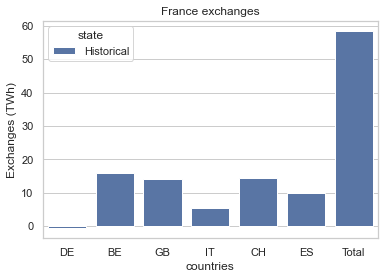

In [20]:
ax = sns.barplot(x="countries", y="Exchanges (TWh)", hue="state",data=exchanges_fr)
ax.title.set_text("France exchanges")

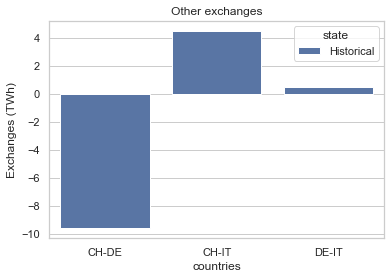

In [21]:
ax = sns.barplot(x="countries", y="Exchanges (TWh)", hue="state",data=other_exchanges)
ax.title.set_text("Other exchanges")

## e. Cost 

In [22]:
capacityCost=np.array([Variables['capacityCosts'].capacityCosts.sum()/10**9])

In [23]:
energyCost=np.array([Variables['energyCosts'].energyCosts.sum()/10**9])

[Text(0, 0, '97.5498')]

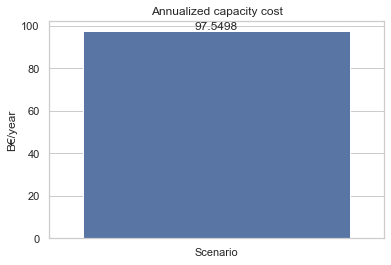

In [24]:
ax=sns.barplot(x=["Scenario"],y=capacityCost)
plt.ylabel("B€/year")
plt.title("Annualized capacity cost")
ax.bar_label(ax.containers[0])

[Text(0, 0, '40.0415')]

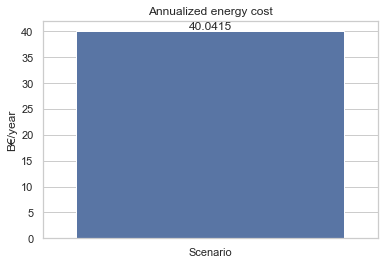

In [25]:
ax=sns.barplot(x=["Scenario"],y=energyCost)
plt.ylabel("B€/year")
plt.title("Annualized energy cost")
ax.bar_label(ax.containers[0])

[Text(0, 0, '137.591')]

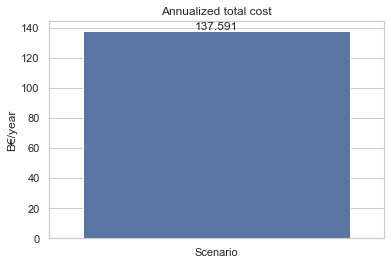

In [26]:
ax=sns.barplot(x=["Scenario"],y=energyCost+capacityCost)
plt.ylabel("B€/year")
plt.title("Annualized total cost")
ax.bar_label(ax.containers[0])

[Text(0, 0, '68.9587')]

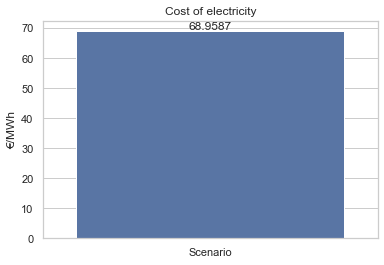

In [27]:
tot_cost=energyCost+capacityCost
ax=sns.barplot(x=["Scenario"],y=tot_cost*10**9/np.array([total_prod])*10**-6)
plt.ylabel("€/MWh")
plt.title("Cost of electricity")
ax.bar_label(ax.containers[0])